In [1]:
import numpy as np
import pandas as pd
import os
import warnings
warnings.filterwarnings('ignore')

In [2]:
ip_path=[]
label=[]

for class_name in os.listdir("PetImages"):
    if not os.path.isdir("PetImages/"+class_name):
        continue
    for path in os.listdir("PetImages/"+class_name):
        if class_name=='Cat':
            label.append(0)
        else:
            label.append(1)
        ip_path.append(os.path.join("PetImages",class_name,path))
print(ip_path[0],label[0])

PetImages/Cat/9733.jpg 0


In [3]:
df=pd.DataFrame()
df['images']=ip_path
df['label']=label
df=df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages/Cat/11357.jpg,0
1,PetImages/Dog/9101.jpg,1
2,PetImages/Cat/698.jpg,0
3,PetImages/Dog/8981.jpg,1
4,PetImages/Dog/10826.jpg,1


In [4]:
from PIL import Image

drop_idx=[]
for i in range(len(df['images'])):
    img_path=df.iloc[i,0]
    try:
        img=Image.open(img_path)
    except:
        drop_idx.append(i)

print(drop_idx)

[1430, 3709, 6069, 16832]


In [5]:
df.drop(drop_idx,inplace=True)

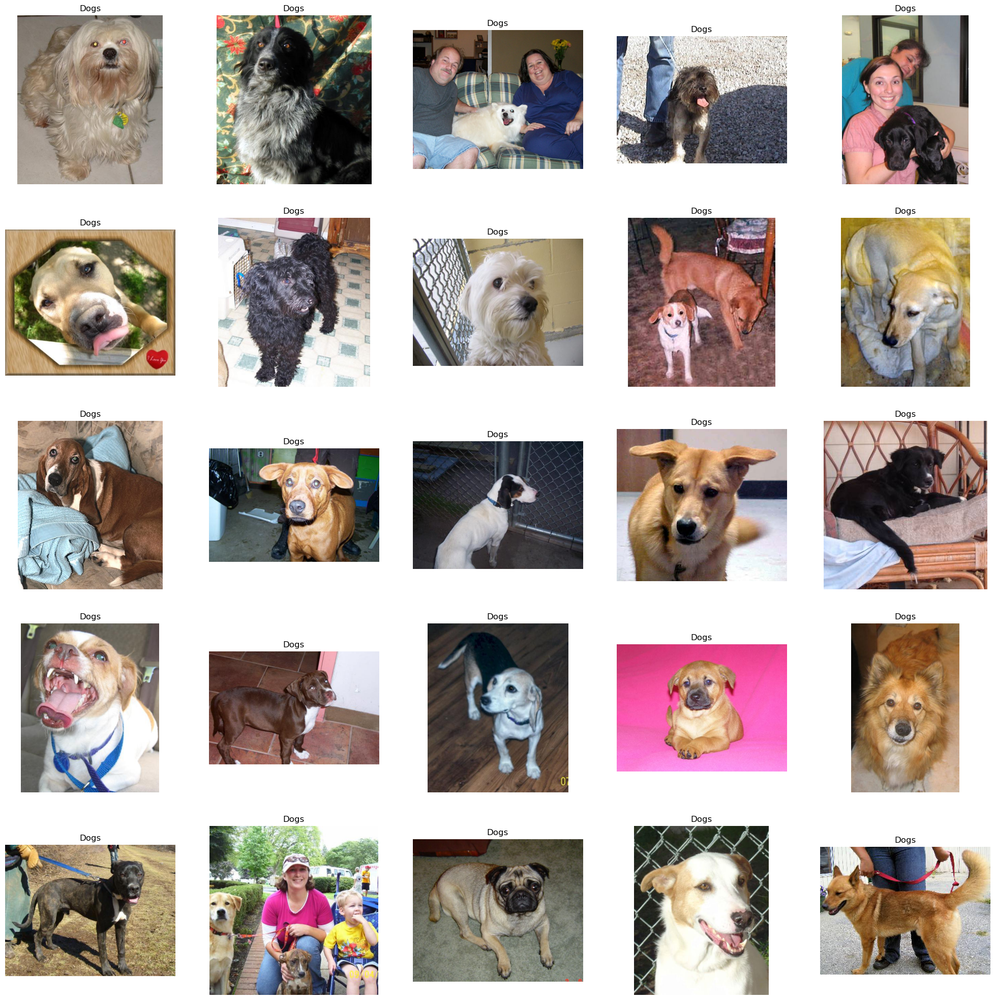

In [6]:
# to display grid of images
import matplotlib.pyplot as plt
from tensorflow.keras.utils import load_img
import random

plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

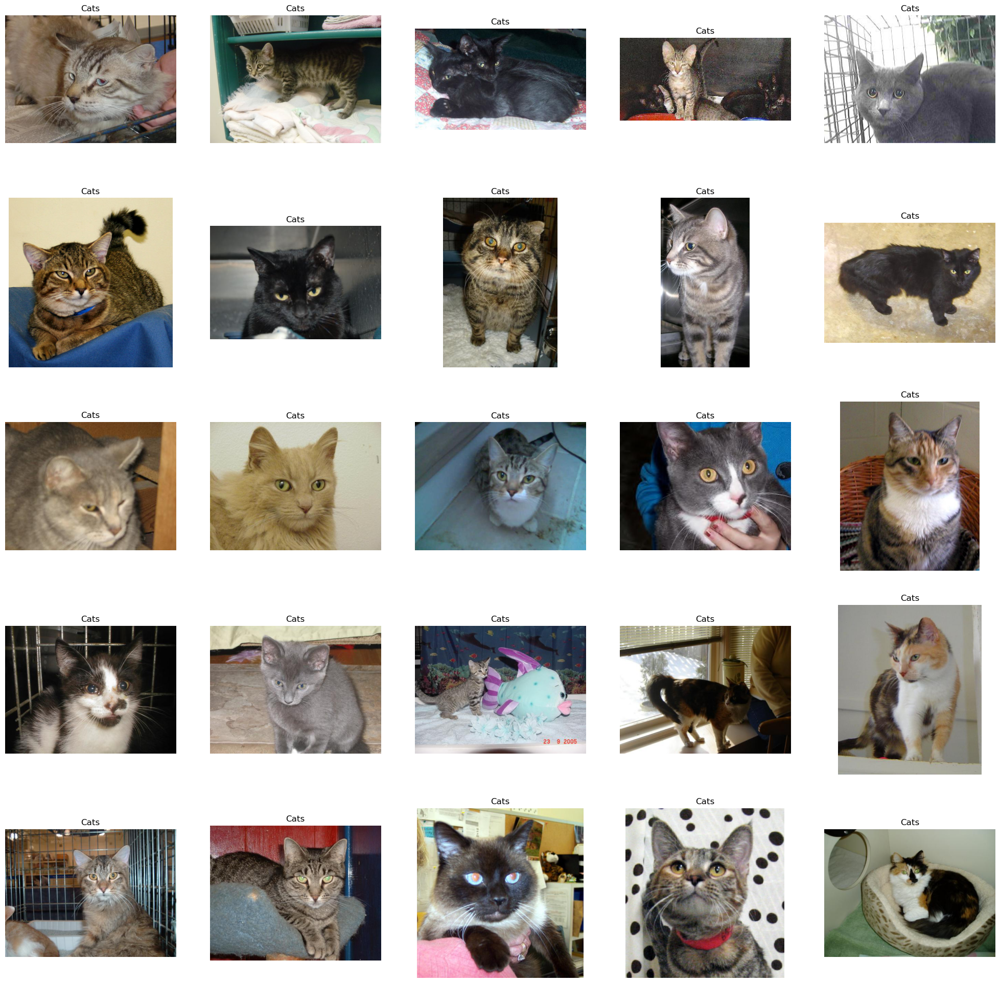

In [7]:
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

<AxesSubplot:xlabel='label', ylabel='count'>

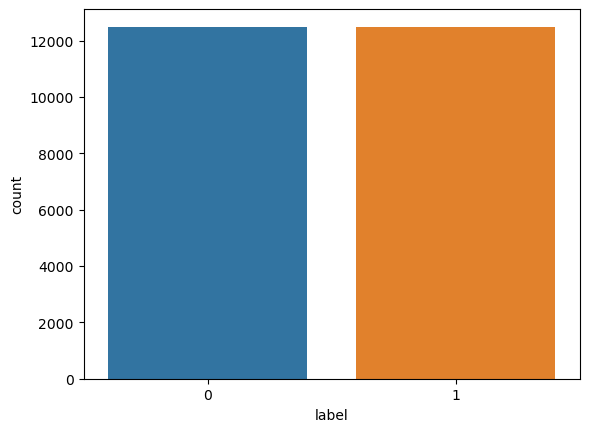

In [8]:
import seaborn as sns
sns.countplot(df['label'])

In [9]:
df['label'] = df['label'].astype('str')

In [10]:
from sklearn.model_selection import train_test_split
train,test=train_test_split(df,test_size=0.2,random_state=42)

In [11]:
from keras_preprocessing.image import ImageDataGenerator
train_generator=ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

val_generator=ImageDataGenerator(rescale=1./255)

In [12]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

model=Sequential()
model.add(Conv2D(16,(3,3),activation='relu',input_shape=(128,128,3)))
model.add(MaxPool2D((2,2)))
model.add(Conv2D(32,(3,3),activation='relu'))
model.add(MaxPool2D((2,2)))
model.add(Conv2D(64,(3,3),activation='relu'))
model.add(MaxPool2D((2,2)))
model.add(Flatten())
model.add(Dense(512,activation='relu'))
model.add(Dense(1,activation='sigmoid'))

Metal device set to: Apple M1


2022-08-24 00:05:33.109810: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-08-24 00:05:33.109916: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [13]:
model.compile(optimizer="adam",loss="binary_crossentropy",metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 64)       0

In [14]:
train_iterator=train_generator.flow_from_dataframe(
    train,x_col='images',y_col='label',
    target_size=(128,128),batch_size=512,class_mode='binary')

val_iterator=val_generator.flow_from_dataframe(
    test,x_col='images',y_col='label',
    target_size=(128,128),batch_size=512,class_mode='binary')

history=model.fit(train_iterator,epochs=10,validation_data=val_iterator)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.
Epoch 1/10


2022-08-24 00:05:34.808852: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-08-24 00:05:35.043571: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


40/40 [==============================] - ETA: 0s - loss: 0.7687 - accuracy: 0.5091

2022-08-24 00:06:38.405267: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


40/40 [==============================] - 70s 2s/step - loss: 0.7687 - accuracy: 0.5091 - val_loss: 0.6838 - val_accuracy: 0.5390
Epoch 2/10
40/40 [==============================] - 66s 2s/step - loss: 0.6588 - accuracy: 0.6096 - val_loss: 0.6260 - val_accuracy: 0.6552
Epoch 3/10
40/40 [==============================] - 66s 2s/step - loss: 0.6118 - accuracy: 0.6685 - val_loss: 0.5921 - val_accuracy: 0.6876
Epoch 4/10
40/40 [==============================] - 66s 2s/step - loss: 0.5945 - accuracy: 0.6844 - val_loss: 0.5555 - val_accuracy: 0.7320
Epoch 5/10
40/40 [==============================] - 66s 2s/step - loss: 0.5520 - accuracy: 0.7217 - val_loss: 0.5292 - val_accuracy: 0.7370
Epoch 6/10
40/40 [==============================] - 67s 2s/step - loss: 0.5319 - accuracy: 0.7344 - val_loss: 0.4964 - val_accuracy: 0.7592
Epoch 7/10
40/40 [==============================] - 66s 2s/step - loss: 0.5135 - accuracy: 0.7470 - val_loss: 0.5119 - val_accuracy: 0.7518
Epoch 8/10
40/40 [=============

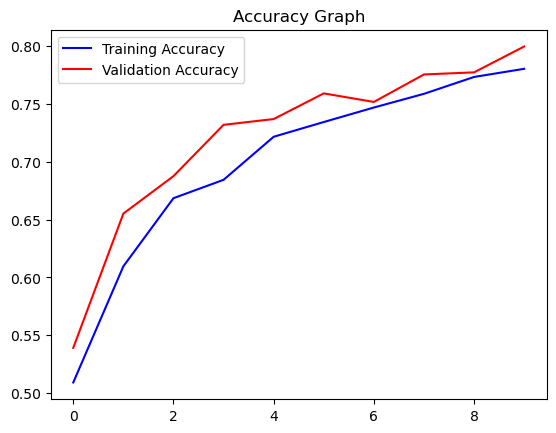

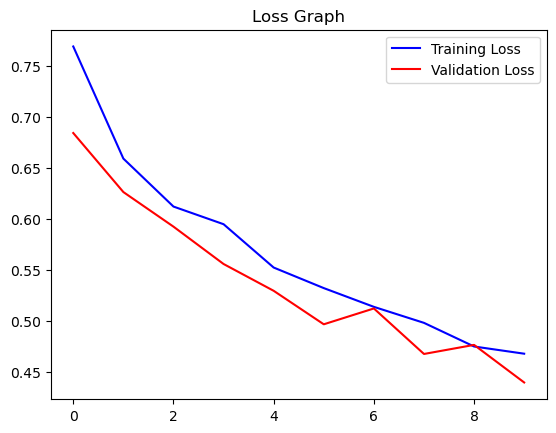

In [15]:
import matplotlib.pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

In [16]:
import tensorflow as tf

img = tf.keras.utils.load_img(test.iloc[15,0], target_size=(128,128))
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

y_pred = model.predict(img_array)
y_pred=np.where(y_pred > 0.5, 1,0)
final_op="Dog" if y_pred==1 else "Cat"

1/1 [==============================] - 0s 134ms/step


2022-08-24 00:16:42.767564: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


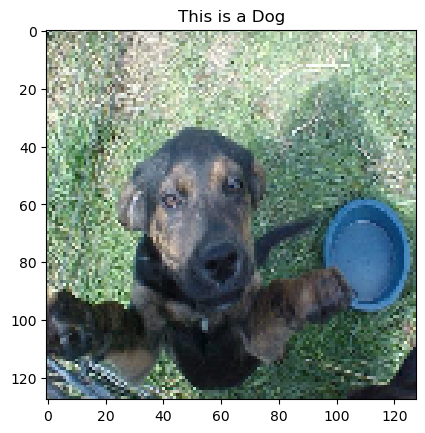

In [17]:
plt.imshow(img, cmap="gray", interpolation='none')
plt.title("This is a {}".format(final_op))
plt.show()